# World Data League 2022

## 🎯 Challenge
*Optimization of Soft-Mobility Drop-off Points*

~~Consider looking through our notebook on [Google Colab](https://drive.google.com/file/d/16cy_bUi4-VBIDsJQ8XCEcMR3NKeRBpot/view?usp=sharing) for the best experience~~

## 👥 Authors
* Ivan Vrkic
* Manuel Bürgler
* Lukas Mölschl

## 💻 Development



### 🧰 Dependencies, Libraries & Tools

To keep things simple, we decided to go with a pretty standard aproach utilizing the power of `pandas`, the vizualisation magic from `plotly`, forecasting by `prophet` and geospatial tools from `geopandas` as well as `folium`. 
A bit more of an exotic is `h3` from Uber which helps us greatly in the geospatial analysis. 

In [ ]:
#@title pip installs
!pip install pandas numpy matplotlib seaborn scikit-learn sklearn plotly requests nbformat chart_studio folium distinctipy
#order matters
!pip install geopandas 
!pip install pydeck 

In [31]:
#@title Libs & Imports

# Standard lib
import pydeck as pdk
import os
import requests
import itertools
import json
import urllib
import zipfile
from typing import Tuple
import base64
import tempfile


# DataFrame and math ops
import pandas as pd
import numpy as np 
from tqdm.notebook import tqdm
tqdm.pandas()

# Plotting libraries
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import cm

from chart_studio import plotly

import plotly.express as px
import plotly.offline as py
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode, iplot
from plotly.subplots import make_subplots
init_notebook_mode(connected=True)

# https://stackoverflow.com/a/57903750/ 
import plotly.io as pio
# pio.renderers.default = "colab"
import distinctipy
# Re-run the whole notebook with this flag enabled so it renders as HTML
pio.renderers.default = "notebook"

# Geo libraries
import geopandas as gpd
import geopandas
from geopandas import GeoDataFrame
import shapely
import xarray as xr
from shapely.geometry import mapping
from shapely.ops import cascaded_union, unary_union
from shapely.geometry.point import Point
from geopy import distance
import folium 
from folium.features import DivIcon




# ML modeling

# EDA

DEBUG = False

import warnings
warnings.filterwarnings('ignore')

### 💡 A (very) short intro into the topic

The chosen challenge focuses on *E-Scooters* in the City of *Porto, Portugal*.
Such E-Scooters offer not only a fun and joyful ride but can also be a climate friendly *last mile* solution for different types of travelers. Unfortunately, the handling of such E-Scooter fleets has led to new challenges for city authorities. [**Cluttering**](https://www.theage.com.au/national/victoria/e-scooters-cluttering-footpaths-challenging-vision-impaired-20211015-p590al.html), [**oversupply and vandalism**](https://edition.cnn.com/2019/08/30/tech/scooter-management/index.html) and many more issues have led to a great deal of frustration in the past. 
The City of Porto already tackled some of the issues mentioned by establishing fixed pick-up / drop-off points as well as restricting the overall number of E-scooters in the city. Porto is a pretty hilly city and even though none of the team members has visited the city yet it may be assumed that walking up & down the whole day can be quite exhausting. An e-scooter is therefor a very comfortable alternative in our eyes and we also would seriously consider this as an alternative way of getting around the city as tourist.

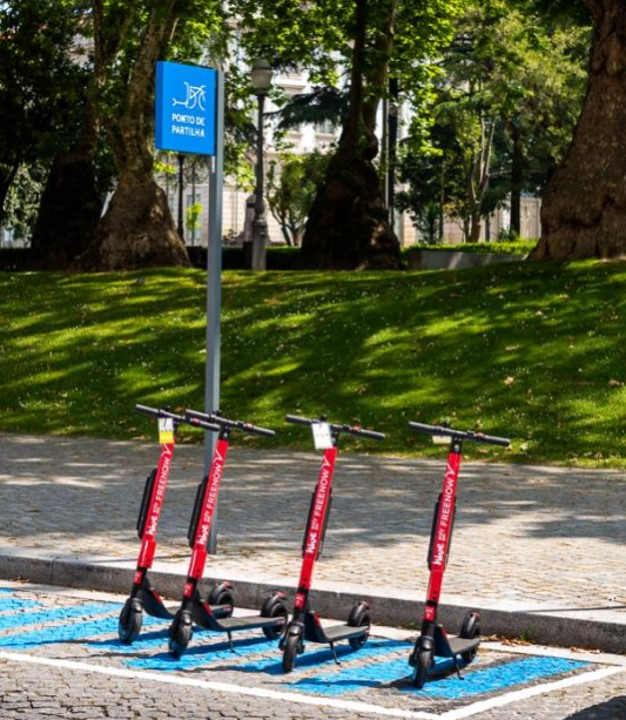


### ⏬ ETL
The ETL pipline prepares the dataset for the following analysis. The folowing steps are executed:

1. Load the data, cast datatypes and drop empty columns
1. Create different dataframes for customer trips and scooter operator events

A detailed description and justification why we selected this time period or how our population model works can be found in the **APPENDIX**. 

#### ETL Processing

In [32]:
#@title ETL Procesing
DATA_DIR = 'data'
PORTO_LAT = 41.150223
PORTO_LONG = -8.629932

def create_data_dir():
    if not os.path.exists(DATA_DIR):
        os.makedirs(DATA_DIR)

def load_soft_mobility_data(transform=True) -> Tuple[pd.DataFrame, pd.DataFrame]:
    create_data_dir()
    # Download dataset
    URL = 'https://wdl-data.fra1.digitaloceanspaces.com/porto/Soft-Mobility.zip'
    DATAFILE = os.path.join(DATA_DIR, 'soft_mobility.zip')

    res = requests.get(URL, allow_redirects=True)
    with open(DATAFILE, 'wb') as data_file:
        data_file.write(res.content)
    
    with zipfile.ZipFile(DATAFILE, 'r') as zip_ref:
        zip_ref.extractall(DATA_DIR)

    scooter_history = os.path.join('data', 'Soft-Mobility', 'E-Scooter OD', 'wdl_od_view.csv')
    scooter_history = pd.read_csv(scooter_history)

    # Cast columns to datatype
    scooter_history = scooter_history.astype({
        'recorded': 'datetime64[ms]',
        'timestamp': 'datetime64[ms]',
        'telemetry_timestamp': 'datetime64[ms]',
        'lat': float,
        'lng': float
    })

    # Split customer events
    df_trips = scooter_history[(scooter_history['event_types'] == '{trip_start}') |
                     (scooter_history['event_types'] == '{trip_end}')]

    # Split operator events
    df_operator = scooter_history[(scooter_history['event_types'] == '{maintenance_pick_up}') |
                                  (scooter_history['event_types'] == '{provider_drop_off}')]


    scooter_parks = os.path.join(
        'data', 'Soft-Mobility', 'E-Scooter Parks', 'e-scooter_parks.json')
    df_parks = gpd.read_file(scooter_parks)
    df_parks['index'] = list(range(1, len(df_parks) + 1))

    return df_trips, df_operator, df_parks

def load_porto_shape():
    shapefile_location = os.path.join('data', 'porto_shape_geojson.geojson')
    return gpd.read_file(shapefile_location)


In [33]:
# Load Data
df_trips, df_operator, df_parks = load_soft_mobility_data()

### 🌎 Part 1: Analyis Traffic Zones 



#### Tying Events To Drop-Off Zones / Scooter Parks
The geolocation that can be obtained from civilian GPS systems is accurate only to a few meters. Such inaccuracy effects are also depending on weather conditions and in narrow streets with buildings. See [the offical documentation](https://www.gps.gov/systems/gps/performance/accuracy/#:~:text=For%20example%2C%20GPS%2Denabled%20smartphones,receivers%20and%2For%20augmentation%20systems.) for details. 

In order to know an event is occuring or a scooter is getting picked up in a drop-off zone / scooter park, we assign each event to a station if the event is witin a 20m radius of such station. 

If there are multiple target stations, we take the one that is closer, in that case we can even target scooters that were far of, without missclassifying any. 


In [34]:
#@title Merge Scooter Parks With Location Events
np_parks_points = df_parks['geometry'].apply(
    lambda row: np.array((row.x, row.y)))
np_parks_points = np.stack(np_parks_points)

def compute_distance_between_points(lat1, lat2, lon1, lon2, metric='m'):
    earth_radius = 6371000
    if metric == 'km':
      earth_radius /= 1000
    dlon = lon1 - lon2
    dlat = lat1 - lat2
    a = np.sin(dlat/2) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2) ** 2
    
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1-a))
    distances = earth_radius * c
    
    return distances
def get_park_id_for_location(point, radius=20):
    np_tmp_points = np.array(
        [[point['lng'], point['lat']]] * len(np_parks_points))
    
    lat1 = np.radians(np_parks_points[::, 1])
    lon1 = np.radians(np_parks_points[::, 0])

    lat2 = np.radians(np_tmp_points[::, 1])
    lon2 = np.radians(np_tmp_points[::, 0])

    distances = compute_distance_between_points(lat1, lat2, lon1, lon2)
    
    distance_min = distances[distances < radius]
    if len(distance_min):
        distance_min = distance_min.min()
        return np.where(distances == distance_min)[0][0]+1
    else:
        return -1

# Assign Station
trips_park_ids = df_trips.apply(get_park_id_for_location, axis=1)

# Merge DataFrame
df_trips_with_parks = df_trips.copy()
df_trips_with_parks['park_id'] = trips_park_ids
df_trips_with_parks = pd.merge(df_trips_with_parks, df_parks, how='inner', left_on='park_id', right_on='index')
df_trips_with_parks['park_lat'] = df_trips_with_parks['geometry'].apply(lambda row: row.x)
df_trips_with_parks['park_lng'] = df_trips_with_parks['geometry'].apply(lambda row: row.y)

# Compute Park Utilization
park_util = df_trips_with_parks.groupby('park_id').size()

# Plot Scooter For One Station
scooter_gps_example = df_trips_with_parks[df_trips_with_parks['objectid_1'] == 2]

m = folium.Map(location=[scooter_gps_example['park_lng'].mean(), scooter_gps_example['park_lat'].mean()], zoom_start=18, 
          tiles='https://api.mapbox.com/styles/v1/mapbox/dark-v10/tiles/{z}/{x}/{y}?access_token=pk.eyJ1IjoibHVtb2UiLCJhIjoiY2wyNXk1a3FnMG4wNDNjcWl5OGhkOXR5dCJ9.Q56CyIVs0C-kaED1Q4HJtQ',
          attr='Mapbox')
folium.Circle(
    radius=20,
    location=[scooter_gps_example['park_lng'].mean(), scooter_gps_example['park_lat'].mean()],
  color="red",
).add_to(m)

scooter_gps_example.apply(lambda row: folium.Circle(location=[row['lat'], row['lng']], radius=1).add_to(m), axis=1)

folium.Circle(
    radius=1,
    location=[scooter_gps_example['park_lng'].mean(), scooter_gps_example['park_lat'].mean()],
    color='red'
).add_to(m)

m


We are also interested in the `organic traffic` per scooter park as this is the traffic which happens without a third person interacting with the system. Our defintiion of `organic traffic` is an aggregation of `trip_start` and `trip_end` events occuring in a specific scooter park. 

Of course said traffic is only possibly by interacting with the system through charging / redistribution. We also tried to build a full "lifetime-cycle" model for each scooter to draw a more precise picture of every scooters journey and exact station load but ran into multiple problems due to incorrect / missing data. 

While some stations have a very high amount of `organic traffic`, the vast majority has only a very low utilization and show clear room for improvements.

In [35]:
#@title Statistic About The Organic Traffic Per Scooter Park

layout = dict(
    yaxis = dict(
        ticksuffix = " events"
    ),
    title='Organic Traffic Per Station',
)
fig = go.Figure(layout=layout)
fig.add_trace(go.Box(
    name='Trip Start / Trip End Events',
    y = park_util,
))

The already mentioned hotspots of `organic traffic` are shown on the map below where as high & red cylinders indicate a hig level of such `organic traffic` and low & green cylinders indicate a low level of traffic. 

It can clearly observed, that as already indicated in the box plot above, the distribution of `organic traffic` is very uneven throughout the city. 

*The map below is interactive, please use the `SHIFT` Key for rotation.*

In [36]:
#@title Identyfing Hotspots Map
def get_column_layer_map(data):
    data = data[['toponimo', 'park_lat', 'park_lng']]
    data = data.groupby(by=['park_lat', 'park_lng', 'toponimo']).size().reset_index()
    data.rename({
        0: 'count'
    }, inplace=True, axis=1)

    view = pdk.data_utils.compute_view(data[["park_lat", "park_lng"]])
    view.pitch = 60
    view.zoom = 11.5
    view.latitude = PORTO_LAT + 0.045
    view.longitude = PORTO_LONG


    column_layer = pdk.Layer(
        "ColumnLayer",
        data=data,
        get_position=["park_lat", "park_lng"],
        get_elevation="count",
        elevation_scale=1,
        radius=30,
        get_fill_color="[count / 10, 255 - (count / 10), 0, 70]",
        pickable=True,
        auto_highlight=True,
    )

    tooltip = {
        "html": "{toponimo}: {count}",
        "style": {"background": "grey", "color": "white", "font-family": '"Helvetica Neue", Arial', "z-index": "10000"},
    }

    r = pdk.Deck(
        column_layer,
        initial_view_state=view,
        tooltip=tooltip,
        map_provider="mapbox",
        map_style=pdk.map_styles.MAPBOX_DARK,
        api_keys=dict(
            mapbox="pk.eyJ1IjoibHVtb2UiLCJhIjoiY2wyNXk1a3FnMG4wNDNjcWl5OGhkOXR5dCJ9.Q56CyIVs0C-kaED1Q4HJtQ")
    )
    return r

r = get_column_layer_map(df_trips_with_parks)
r


{"initialViewState": {"latitude": 41.195223, "longitude": -8.629932, "pitch": 60, "zoom": 11.5}, "layers": [{"@@type": "ColumnLayer", "autoHighlight": true, "data": [{"count": 1770, "park_lat": -8.688396746409325, "park_lng": 41.172649985550706, "toponimo": "Via do Castelo do Queijo"}, {"count": 1664, "park_lat": -8.687839702937518, "park_lng": 41.166750462267615, "toponimo": "Avenida de Montevideu"}, {"count": 959, "park_lat": -8.68647628482138, "park_lng": 41.16433800502017, "toponimo": "Avenida de Montevideu"}, {"count": 612, "park_lat": -8.683496501780429, "park_lng": 41.15940573208178, "toponimo": "Rua do Molhe"}, {"count": 1455, "park_lat": -8.683382743661502, "park_lng": 41.15900654136424, "toponimo": "Avenida do Brasil"}, {"count": 1401, "park_lat": -8.68167910678423, "park_lng": 41.15699378094385, "toponimo": "Avenida do Brasil"}, {"count": 380, "park_lat": -8.680363262618181, "park_lng": 41.16660887828749, "toponimo": "Avenida da Boavista"}, {"count": 2146, "park_lat": -8.679049192410506, "park_lng": 41.153871738760834, "toponimo": "Avenida do Brasil"}, {"count": 2023, "park_lat": -8.675892288824432, "park_lng": 41.14934843039875, "toponimo": "Esplanada do Castelo"}, {"count": 1904, "park_lat": -8.674832833198009, "park_lng": 41.148151508942426, "toponimo": "Avenida de D. Carlos I"}, {"count": 448, "park_lat": -8.674011065662574, "park_lng": 41.1542186840258, "toponimo": "Rua da Cerca"}, {"count": 1295, "park_lat": -8.671938189083738, "park_lng": 41.16574205500588, "toponimo": "Avenida do Parque"}, {"count": 1328, "park_lat": -8.67169583898071, "park_lng": 41.14759220187746, "toponimo": "Avenida de D. Carlos I"}, {"count": 332, "park_lat": -8.671648457321165, "park_lng": 41.15545343929727, "toponimo": "AMGCO0"}, {"count": 255, "park_lat": -8.671515945551741, "park_lng": 41.14898245215499, "toponimo": "Esplanada do Castelo"}, {"count": 310, "park_lat": -8.671428371995301, "park_lng": 41.15383531548616, "toponimo": "Rua de Diogo Botelho"}, {"count": 272, "park_lat": -8.670062338817813, "park_lng": 41.14850965851483, "toponimo": "Rua do Passeio Alegre"}, {"count": 259, "park_lat": -8.669341630273374, "park_lng": 41.1631934304752, "toponimo": "RPLEA0"}, {"count": 228, "park_lat": -8.667533902261829, "park_lng": 41.157341028219925, "toponimo": "AMGCO0"}, {"count": 66, "park_lat": -8.667438985524017, "park_lng": 41.157103704565074, "toponimo": "AMGCO0"}, {"count": 1044, "park_lat": -8.667406707628464, "park_lng": 41.14755430699348, "toponimo": "Rua do Passeio Alegre"}, {"count": 335, "park_lat": -8.666149852152076, "park_lng": 41.15951815148669, "toponimo": "PDAQU0"}, {"count": 78, "park_lat": -8.665500201331989, "park_lng": 41.157867377175734, "toponimo": "Avenida do Marechal Gomes da Costa"}, {"count": 1262, "park_lat": -8.665081340810227, "park_lng": 41.148001089210446, "toponimo": "Rua do Passeio Alegre"}, {"count": 166, "park_lat": -8.664725157674544, "park_lng": 41.15844657829779, "toponimo": "Avenida do Marechal Gomes da Costa"}, {"count": 204, "park_lat": -8.66384680149657, "park_lng": 41.15609769903509, "toponimo": "RJBAR0"}, {"count": 204, "park_lat": -8.66304129327484, "park_lng": 41.16329753677602, "toponimo": "RTANG0"}, {"count": 63, "park_lat": -8.66283178817902, "park_lng": 41.15455273403011, "toponimo": "RJBAR0"}, {"count": 447, "park_lat": -8.662388388682608, "park_lng": 41.16423563044233, "toponimo": "ADAGU0"}, {"count": 52, "park_lat": -8.6622767717964, "park_lng": 41.15008466434449, "toponimo": "Rua 13 do Bairro da Rainha D. Leonor"}, {"count": 82, "park_lat": -8.661933079230495, "park_lng": 41.15324373963458, "toponimo": "Rua de Jo\u00e3o de Barros"}, {"count": 423, "park_lat": -8.660723821219372, "park_lng": 41.147312776945874, "toponimo": "Rua das Sobreiras"}, {"count": 192, "park_lat": -8.66041248324485, "park_lng": 41.15765667949924, "toponimo": "RGEAN0"}, {"count": 324, "park_lat": -8.660170845686803, "park_lng": 41.15932454547058, "toponimo": "Rua de D. Jo\u00e3o de Castro"}, {"count": 127, "park

#### 🔍 Discussion & Results


In our analysis above we looked into the total amount of trip-starts and trip-ends. We assume that the total number of those events is a good indicator for the related "traffic" in the respective scooter parks. 

As people unfortunately tend to not be able to park their scooters in a "tidy" and accorindg to the parking scheme, we assume that the servicing effort is higher in "high-traffic" scooter parks. On the other hand scooter parks which are only barely used also need some minimal servicing and tie up ressources and are susequently inefficient. 

Looking into the results two main points are clearly observable:

1.   The Hotspots are in the old town & near the coast which indicates tourist use.
2.   The distribution of utilization of the Scooter parks is very uneven throughout the city. 

But let's go through the points one by one. 

Firstly, it was somewhat expected that very high traffic areas are found in the old-town / city center. The stop with the most traffic in Sao Nicolau / 'RNALF0' is a perfect example. Located next to a bus stop / tourist parking area it is the perferct spot to either start exploring the city center to the north, down the promenad to the west or the restaurants to the east. 
The scooter park with the second most traffic is rigth next to the main subway / train station "Sao Bento". This indicates that the scooters are also used for "last mile" trips. Whats positiv on the Sao Bento scooter park is the increased capacity of 20 scooters. 
Other high traffic areas are near the beach.

Secondly, speaking of distribution it comes clear that there is only a very "uneven" usage & traffic distribution through the city. Especially the parks in the industrial zone dont seem to be used at all. This clearly shows some room for improvement in the future.

Proposal:

> As the trip start & end points are that concentrated a proposal on local charging infrastructure could be made. Given the fact that the parks are close to Street Lighting / Bus Stations the most important  infrastructure (power supply) is already in place. 

This would effectively reduce transportation related emmissions. 
*(It has to be noted, that the overall effect would be greatly depending on the scooter type esp. built-in battery vs. swappable battery)*


### 🅾 Part 2: Dropoff Zone Optimization

We propose a system that allows the city planner to identify underutilized drop-off zones that experienced less than `x` in- and outbound `organic traffic`. In the next step our algorithm computes based on this input:
1. The total in- and outbound traffic for each station based on the complete historic data
2. Compute the distance between all drop-off zones in form of an adjacency matrix, so it needs only be computed once. 
3. Find for each of the underutilized drop-off zones one of the top-k closest drop-off zones.
4. Remove circular dependencies. This makes sure that the replacement for an underutilized drop-off zone is not getting replaced by itself. 
5. Compute the sum of in- and outgoing traffic for the removed and replacement drop-off zone together

 The results are visualized in a way that allows the planner to quickly identify potential replacements/weaknesses in the system. The sum can be used by the planner to identify if the replacement drop-off zone would overflow with the additional load that is coming from the removed zone. 

Our system is not tailored for this exact situation or dataset. We expect the system to change over time, the process of moving, removing, and increasing the size of drop-off zones needs to be done every year. Our solution is capable of providing a solution to a changed scenario as well.

Future work might involve adding additional parameters to the algorithm. For example, the distance between two drop-off zones could be computed using a routing algorithm or the number of available parking spots that could be converted. 

The parameter in this example are:
- We consider a station overutilized if the organic traffic is larger than 1800
- We consider a station underutilized if the organic traffic is smaller than 30

These values correspond to the 95% and 5% of all stations and a target number of nine possible zone replacements. 

*On the map below, neighbouring(k-nearest) stations share the same color. The stations which could be removed show their organic traffic count crossed out.*

In [37]:
#@title Computation Of Underutilized And Overutilized Parks

low_util, high_util = park_util[park_util < 30], park_util[park_util > 1800]
low_util_idx = low_util.index - 1
high_util_idx = high_util.index - 1

def divicon(color, number, fontcolor, crossed_out, size):
    icon = DivIcon(
            icon_size=(200,45),
            icon_anchor=(14,40),
            html=f"""
            <style>
              .strike{{
                  position: relative;
              }}
              .strike::after{{
                  content: '';
                  border-bottom: 1px solid black;
                  position: absolute;
                  left: 0;
                  top: 50%;
                  width: 100%;
              }}
            </style>
            <span class="fa-stack " style="font-size: {size}pt; color:{fontcolor}" >
            <span class="fa fa-circle fa-stack-2x" style="color : {color}"></span>
            <strong class="fa-stack-1x" style="font-size: 10pt; ">
                <span class="{'strike' if crossed_out else ''}">{number:2d}</span> 
            </strong>
            </span></span>"""
        )
    # {'text-decoration: line-through;' if crossed_out else ''}
    return icon

# Compute distances 
park_distances = []
lat1, lng1, = np.radians(np_parks_points)[::, 0], np.radians(np_parks_points)[::, 1]
for i in range(len(np_parks_points)):
  row = np.radians(np_parks_points)[i]
  rows = np.tile(row, (len(np_parks_points),1))
  lat2, lng2, = rows[::, 0], rows[::, 1]
  distances = compute_distance_between_points(lat1, lat2, lng1, lng2)
  park_distances.append(distances)

park_distances = np.array(park_distances)
assert np.equal(np.tile(0., len(np_parks_points)), park_distances.diagonal()).all()

# Replace self referencing with very large value
park_distances = np.where(park_distances==0, 1e9, park_distances) 

def get_parking_point_close_to_idx(station_idx, top_k=1):
  sorted_index = np.argpartition(park_distances[station_idx], top_k)

  return sorted_index[:top_k]

def idx_to_park_id(idx):
  return int(park_util.reset_index().iloc[idx]['park_id'])

def plot_top_k_position(station_ids, top_k=1):
  m = folium.Map(location=[PORTO_LAT, PORTO_LONG], zoom_start=13, 
                tiles='https://api.mapbox.com/styles/v1/mapbox/dark-v10/tiles/{z}/{x}/{y}?access_token=pk.eyJ1IjoibHVtb2UiLCJhIjoiY2wyNXk1a3FnMG4wNDNjcWl5OGhkOXR5dCJ9.Q56CyIVs0C-kaED1Q4HJtQ',
                attr='Mapbox')
  
  colors = (np.array(distinctipy.get_colors(len(station_ids), pastel_factor=0.7, colorblind_type="Deuteranomaly"))*255).astype(int)
  subsitute = dict()

  for idx, station_id in enumerate(station_ids):
    color = '#%02x%02x%02x9f' % tuple(colors[idx])

    station_id_found = get_parking_point_close_to_idx(station_id, top_k)
    station_id_found = int(station_id_found[0])
    if idx_to_park_id(station_id) in subsitute.keys() or idx_to_park_id(station_id) in subsitute.values():
      continue

    subsitute[idx_to_park_id(station_id)] = idx_to_park_id(station_id_found)

    station_id_found = list([station_id_found]) + [station_id]
    stations = df_parks.iloc[station_id_found]
 
    stations.apply(lambda row: folium.Marker(location=[row['geometry'].y, row['geometry'].x], icon=divicon(color, row['n_id'], fontcolor='black', crossed_out=(row['index'] - 1) == station_id, size=14)).add_to(m), axis=1)
    # stations.apply(lambda row: folium.CircleMarker(location=[row['geometry'].y, row['geometry'].x], radius=12, color=color, fill_color='Tomato' if (row['index'] - 1) == station_id else 'MediumSeaGreen', fill_opacity=.8).add_to(m), axis=1)
    # stations.apply(lambda row: folium.Marker(location=[row['geometry'].y, row['geometry'].x], icon=DivIcon( icon_size=(150,36), icon_anchor=(0,0), html='<div style="font-size: 10pt; color: white">%s</div>' % row['n_id'], )).add_to(m), axis=1)

  return m, subsitute

m, subsitute = plot_top_k_position(low_util_idx, top_k=1)

m



Additionally, we identified stations which should be increased in capacity. 

As we also have observed that the average trip time / trip distance is way below the technically possible in terms of battery capacity (see Appendix) we think that an increase in capacity of higg-traffic stations would have the following postive impacts:

- Less third party (operator) redistribution needed -> less KM driven by a transportation van.
- Local charging solutions could be implemented in high capacity stations. 


In [38]:
#@title Overutlized Stations To Increase
m = folium.Map(location=[PORTO_LAT, PORTO_LONG], zoom_start=14, 
          tiles='https://api.mapbox.com/styles/v1/mapbox/dark-v10/tiles/{z}/{x}/{y}?access_token=pk.eyJ1IjoibHVtb2UiLCJhIjoiY2wyNXk1a3FnMG4wNDNjcWl5OGhkOXR5dCJ9.Q56CyIVs0C-kaED1Q4HJtQ',
          attr='Mapbox')
df_parks.iloc[high_util_idx].apply(lambda row: folium.Marker(location=[row['geometry'].y, row['geometry'].x], icon=divicon('#76fa729f', row['n_id'], fontcolor='black', crossed_out=False, size=20)).add_to(m), axis=1)
m


In [39]:
#@title Replaced Stations Overview


print('Station to be removed -> Alternative station')
print(json.dumps(subsitute, sort_keys=True, indent=0).replace('"', '').replace(':', '->').replace('}', '').replace('{', ''))

# park_util[]
sub_a = park_util[park_util.reset_index()['park_id'].isin(subsitute.keys()).values].values
sub_b = park_util[park_util.reset_index()['park_id'].isin(subsitute.values()).values].values
print('New predicted organic traffic in alternative station')
print(json.dumps(dict(zip(subsitute.values(), (sub_a + sub_b).astype(int).tolist())), sort_keys=True, indent=0).replace('"', '').replace(':', '->').replace('}', '').replace('{', ''))

Station to be removed -> Alternative station

4-> 133,
5-> 205,
72-> 71,
109-> 169,
139-> 140,
141-> 143,
145-> 188,
184-> 69,
189-> 187

New predicted organic traffic in alternative station

69-> 185,
71-> 253,
133-> 133,
140-> 1144,
143-> 221,
169-> 531,
187-> 563,
188-> 956,
205-> 483



#### 🔍 Discussion & Results

Again, continuing at the discussion from part 1 we provide a possible solution to the over/underutilization problem. 

As already expected areas of capacity increase are mainly in the old-town and on the promenade / beach. Interestingly though, the station with the most `trip_starts` and `trip_ends` does not show the greatest difference in scooters. Looking further into the data we saw, that the station is used as an outbound hub in the morning and as an inbound station in the afternoon. Again, increasing capacity here would open up the potential for local charging. 

### ⚡ Part 3: Route Analysis

In addition to identifying the organic traffic per station, we want to investigate which routes users are taking after picking up the scooters. 

Technically we do this by joining all events that are tagged as `trip_start` with all events that are tagged as `trip_end`. We use an inner join which already eliminates all trips that started but never ended. 

In [40]:
df_trips.value_counts('event_types')

event_types
{trip_start}    71909
{trip_end}      65091
dtype: int64

There are almost 7.000 trips that started but have no trip end event. There might be several reasons for that. 

Firstly, we assume that the data is based on the Mobility Data Specification ([MDS](https://github.com/openmobilityfoundation/mobility-data-specification)). But, although the data is very similar to this specification there is no official confirmation on this matter. 
If in fact it is based on this specification, each scooter would follow a complex [state machine](https://github.com/openmobilityfoundation/mobility-data-specification/blob/26705816a4dd23d23a41cbd24d99948d2674b6f0/general-information.md#state-machine-diagram=) where it is possible to have multiple `trip_start` events. 

Due to time constraints, we did not re-implement this state machine.

Additionally another reason for such a high number could be bad data quality, although we cannot say that for sure as well. 



{"initialViewState": {"latitude": 41.150223, "longitude": -8.629932, "pitch": 60, "zoom": 12}, "layers": [{"@@type": "ArcLayer", "autoHighlight": true, "data": [{"A": 23.92996500000001, "B": 36.703680000000006, "G": 231.070035, "R": 253.27824, "count": 206, "park_lat_x": -8.688396746409325, "park_lat_y": -8.688396746409325, "park_lng_x": 41.172649985550706, "park_lng_y": 41.172649985550706}, {"A": 122.63128499999999, "B": 141.92586, "G": 132.368715, "R": 36.913545, "count": 32, "park_lat_x": -8.688396746409325, "park_lat_y": -8.687839702937518, "park_lng_x": 41.172649985550706, "park_lng_y": 41.166750462267615}, {"A": 222.90876, "B": 113.46480000000001, "G": 32.09124, "R": 72.21268500000001, "count": 7, "park_lat_x": -8.688396746409325, "park_lat_y": -8.68647628482138, "park_lng_x": 41.172649985550706, "park_lng_y": 41.16433800502017}, {"A": 233.4984, "B": 103.89057, "G": 21.5016, "R": 71.76872999999999, "count": 5, "park_lat_x": -8.688396746409325, "park_lat_y": -8.683496501780429, "park_lng_x": 41.172649985550706, "park_lng_y": 41.15940573208178}, {"A": 178.281975, "B": 137.91522, "G": 76.718025, "R": 61.03323, "count": 17, "park_lat_x": -8.688396746409325, "park_lat_y": -8.683382743661502, "park_lng_x": 41.172649985550706, "park_lng_y": 41.15900654136424}, {"A": 162.249615, "B": 140.81252999999998, "G": 92.75038500000001, "R": 53.678264999999996, "count": 21, "park_lat_x": -8.688396746409325, "park_lat_y": -8.68167910678423, "park_lng_x": 41.172649985550706, "park_lng_y": 41.15699378094385}, {"A": 187.36023, "B": 135.145665, "G": 67.63977, "R": 64.75342500000001, "count": 15, "park_lat_x": -8.688396746409325, "park_lat_y": -8.679049192410506, "park_lng_x": 41.172649985550706, "park_lng_y": 41.153871738760834}, {"A": 219.06387, "B": 116.666835, "G": 35.93613, "R": 72.068865, "count": 8, "park_lat_x": -8.688396746409325, "park_lat_y": -8.675892288824432, "park_lng_x": 41.172649985550706, "park_lng_y": 41.14934843039875}, {"A": 237.70182, "B": 99.938835, "G": 17.29818, "R": 71.28932999999999, "count": 4, "park_lat_x": -8.688396746409325, "park_lat_y": -8.674832833198009, "park_lng_x": 41.172649985550706, "park_lng_y": 41.148151508942426}, {"A": 253.75713, "B": 84.000825, "G": 1.24287, "R": 68.08602, "count": 1, "park_lat_x": -8.688396746409325, "park_lat_y": -8.674011065662574, "park_lng_x": 41.172649985550706, "park_lng_y": 41.1542186840258}, {"A": 200.412405, "B": 129.29826, "G": 54.587595, "R": 69.001725, "count": 12, "park_lat_x": -8.688396746409325, "park_lat_y": -8.671938189083738, "park_lng_x": 41.172649985550706, "park_lng_y": 41.16574205500588}, {"A": 204.071145, "B": 127.22230499999999, "G": 50.928855000000006, "R": 69.90263999999999, "count": 11, "park_lat_x": -8.688396746409325, "park_lat_y": -8.67169583898071, "park_lng_x": 41.172649985550706, "park_lng_y": 41.14759220187746}, {"A": 253.75713, "B": 84.000825, "G": 1.24287, "R": 68.08602, "count": 1, "park_lat_x": -8.688396746409325, "park_lat_y": -8.670062338817813, "park_lng_x": 41.172649985550706, "park_lng_y": 41.14850965851483}, {"A": 249.91479, "B": 88.553595, "G": 5.08521, "R": 69.182775, "count": 2, "park_lat_x": -8.688396746409325, "park_lat_y": -8.669341630273374, "park_lng_x": 41.172649985550706, "park_lng_y": 41.1631934304752}, {"A": 228.124785, "B": 108.86001, "G": 26.875215, "R": 72.14205, "count": 6, "park_lat_x": -8.688396746409325, "park_lat_y": -8.667406707628464, "park_lng_x": 41.172649985550706, "park_lng_y": 41.14755430699348}, {"A": 243.737415, "B": 94.39182, "G": 11.262585, "R": 70.38561, "count": 3, "park_lat_x": -8.688396746409325, "park_lat_y": -8.666149852152076, "park_lng_x": 41.172649985550706, "park_lng_y": 41.15951815148669}, {"A": 253.75713, "B": 84.000825, "G": 1.24287, "R": 68.08602, "count": 1, "park_lat_x": -8.688396746409325, "park_lat_y": -8.665500201331989, "park_lng_x": 41.172649985550706, "park_lng_y": 41.157867377175734}, {"A": 253.75713, "B": 84.000825, "G": 1.24287, "R": 68.08602, "count": 1, "park_lat_x": -8.688396746409

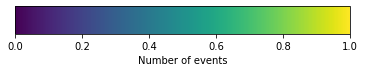

In [41]:
#@title Map Of All Routes Taken By User

# Create dataframe with all start-end tuples
a = df_trips_with_parks[df_trips_with_parks['event_types'] == '{trip_start}']
b = df_trips_with_parks[df_trips_with_parks['event_types'] == '{trip_end}']
df_trips_start_end = pd.merge(a, b, on='trip_id')

g = ['n_id_x', 'n_id_y']

df_trips_start_end_grouped = df_trips_start_end.groupby(by=['park_lat_x', 'park_lng_x', 'park_lat_y', 'park_lng_y']).size().reset_index()
df_trips_start_end_grouped.rename({
        0: 'count'
}, inplace=True, axis=1)
 
figure, axes = plt.subplots(figsize =(6, 1))
figure.subplots_adjust(bottom = 0.5)
 
# Create color map
color_map = cm.get_cmap('viridis')
normalizer = mpl.colors.Normalize(vmin = df_trips_start_end_grouped['count'].min(), vmax = 70)
normalizer_tmp = mpl.colors.Normalize(vmin = 0, vmax = 1)
 
figure.colorbar(mpl.cm.ScalarMappable(norm = normalizer_tmp,
              cmap = color_map),
              cax = axes, orientation ='horizontal',
              label ='Number of events')
color_scaler = mpl.cm.ScalarMappable(norm = normalizer, cmap = color_map)

color_map = color_scaler.to_rgba(df_trips_start_end_grouped['count'].values) * 255
df_trips_start_end_grouped['R'] = color_map[::, 0]
df_trips_start_end_grouped['G'] = color_map[::, 1]
df_trips_start_end_grouped['B'] = color_map[::, 2]
df_trips_start_end_grouped['A'] = 255 - color_map[::, 1]

GREEN_RGB = [0, 255, 0, 20]
RED_RGB = [255, 0, 0, 20]

arc_layer = pdk.Layer(
    "ArcLayer",
    data=df_trips_start_end_grouped,
    get_width="count / 10",
    get_source_position=["park_lat_x", "park_lng_x"],
    get_target_position=["park_lat_y", "park_lng_y"],
    get_tilt=15,
    get_source_color="[R, G, B, 40]",
    get_target_color="[R, G, B, 40]",
    pickable=True,
    auto_highlight=True,
)

view_state = pdk.ViewState(latitude=PORTO_LAT, longitude=PORTO_LONG, pitch=60, zoom=12,)


TOOLTIP_TEXT = {"html": "{count}"}
r = pdk.Deck(arc_layer, initial_view_state=view_state, tooltip=TOOLTIP_TEXT)
r

In [42]:
print("Trip comibinations", len(df_trips_start_end))
print("Total number of trips", len(df_trips_with_parks))

Trip comibinations 44101
Total number of trips 116194


1. There are in total 8813 different trip combinations but only 116144 (unique start- and endpoint)
1. Hinten im Egg isch die Uni 

#### 🔍 Discussion & Results



## 👓 References
Data:



Articles and Papers:


## ⏭️ Appendix

### Metrics Of Trips

#### Trip Time 

In order to better understand the data and the users of the system we investigate server metrics. First one ist the time span of the trip start to the trip end. 

In [43]:
#@title Fig. Trip times
trip_times = df_trips_start_end['telemetry_timestamp_y'] - df_trips_start_end['telemetry_timestamp_x']
trip_times_min = trip_times / np.timedelta64(1, 'm')
layout = dict(
    yaxis = dict(
        ticksuffix = " minutes"
    ),
    title='Trip times',
)
fig = go.Figure(layout=layout)
fig.add_trace(go.Box(
    name='Trip times',
    y = trip_times_min,
))

The average trip time per scooter is 18 minutes and 43 seconds.

#### Distance Of Trip 



In [44]:
#@title Fig. Trip Distances

lat1, lat2, lon1, lon2 = [np.radians(df_trips_start_end[g].values) for g in ['lat_y', 'lat_x', 'lng_y', 'lng_x']]
trip_distances = compute_distance_between_points(lat1, lat2, lon1, lon2, metric='km')

layout = dict(
    yaxis = dict(
        ticksuffix = " km"
    ),
    title='Trip distances',
)
fig = go.Figure(layout=layout)
fig.add_trace(go.Box(
    name='Trip distance',
    y = trip_distances,
))